<a href="https://colab.research.google.com/github/Sadickachuli/Machine-Learning-Techniques/blob/main/nst_tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Import necessary libraries
import tensorflow as tf
from tensorflow.keras.applications import vgg19
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from google.colab import drive

In [2]:
# Function to load and preprocess images
def load_and_process_image(image_path, target_size=(224, 224)):
    img = load_img(image_path, target_size=target_size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return img

# Function to deprocess images for visualization
def deprocess_image(processed_img):
    x = processed_img.copy()
    x = x.reshape((x.shape[1], x.shape[2], x.shape[3]))
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [3]:

drive.mount('/content/drive')

Mounted at /content/drive


In [17]:
# Load content and style images
content_image_path = 'Cape-Coast-Ghana.jpg'  # Upload your content image
style_image_path = 'van gogh.jpg'      # Upload your style image
content_image = load_and_process_image(content_image_path)
style_image = load_and_process_image(style_image_path)

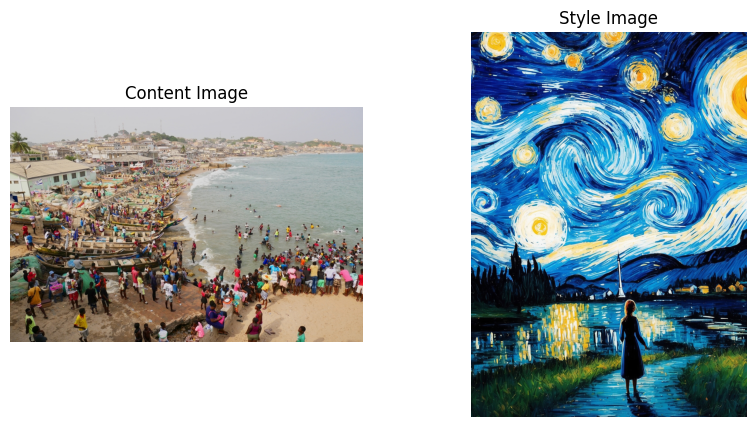

In [18]:
# Display the images
def show_images(content, style):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(Image.open(content_image_path))
    axs[0].set_title("Content Image")
    axs[0].axis('off')
    axs[1].imshow(Image.open(style_image_path))
    axs[1].set_title("Style Image")
    axs[1].axis('off')
    plt.show()

show_images(content_image_path, style_image_path)

In [19]:
# Load the VGG19 model and freeze all layers
vgg = vgg19.VGG19(weights='imagenet', include_top=False)
vgg.trainable = False

# Select layers for content and style features
content_layer = ['block5_conv2']  # Layer for content representation
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']  # Layers for style representation

In [20]:

# Function to extract features
def get_model():
    outputs = [vgg.get_layer(name).output for name in (content_layer + style_layers)]
    model = tf.keras.Model([vgg.input], outputs)
    return model

model = get_model()

In [21]:
# Function to compute content loss
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

# Function to compute Gram matrix
def gram_matrix(input_tensor):
    # Reshape the tensor to [batch_size, height * width, channels]
    input_tensor = tf.reshape(input_tensor, [tf.shape(input_tensor)[0], -1, tf.shape(input_tensor)[-1]])
    # Compute Gram matrix
    gram = tf.matmul(input_tensor, input_tensor, transpose_a=True)
    return gram / tf.cast(tf.shape(input_tensor)[1], tf.float32)

# Function to compute style loss
def compute_style_loss(base_style, gram_target):
    gram_style = gram_matrix(base_style)
    # Ensure dimensions match
    if gram_style.shape != gram_target.shape:
        raise ValueError(f"Shape mismatch: Gram Style {gram_style.shape}, Gram Target {gram_target.shape}")
    return tf.reduce_mean(tf.square(gram_style - gram_target))

# Function to compute total loss
def compute_loss(model, loss_weights, generated_image, content_features, style_grams):
    content_weight, style_weight = loss_weights
    model_outputs = model(generated_image)

    # Separate content and style outputs
    gen_content_features = model_outputs[:len(content_layer)]
    gen_style_features = model_outputs[len(content_layer):]

    # Compute content loss
    content_loss = tf.add_n([
        compute_content_loss(gen_content, target_content)
        for gen_content, target_content in zip(gen_content_features, content_features)
    ])

    # Compute style loss
    style_loss = tf.add_n([
        compute_style_loss(gen_style, target_style)
        for gen_style, target_style in zip(gen_style_features, style_grams)
    ])

    # Compute total loss
    total_loss = content_weight * content_loss + style_weight * style_loss
    return total_loss

# Extract content and style features
def get_feature_representations(model, content_image, style_image):
    content_outputs = model(content_image)
    style_outputs = model(style_image)
    content_features = [content_outputs[i] for i in range(len(content_layer))]
    style_features = [style_outputs[i] for i in range(len(content_layer), len(content_layer) + len(style_layers))]
    return content_features, style_features


# Precompute features
content_features, style_features = get_feature_representations(model, content_image, style_image)
style_grams = [gram_matrix(feature) for feature in style_features]

# Set optimizer and hyperparameters
content_weight = 1e3
style_weight = 1e-2
optimizer = tf.optimizers.Adam(learning_rate=5.0)

# Training step
@tf.function
def train_step(generated_image):
    with tf.GradientTape() as tape:
        loss = compute_loss(model, (content_weight, style_weight), generated_image, content_features, style_grams)
    gradients = tape.gradient(loss, generated_image)
    optimizer.apply_gradients([(gradients, generated_image)])
    return loss

Epoch 0: Loss = 11691947008.0


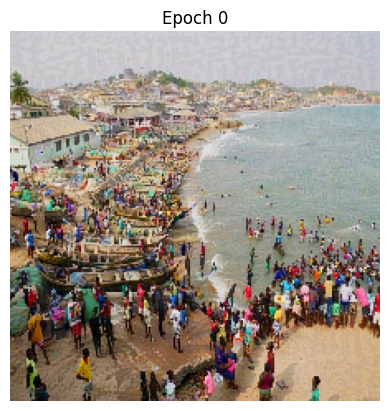

Epoch 2: Loss = 5855626240.0


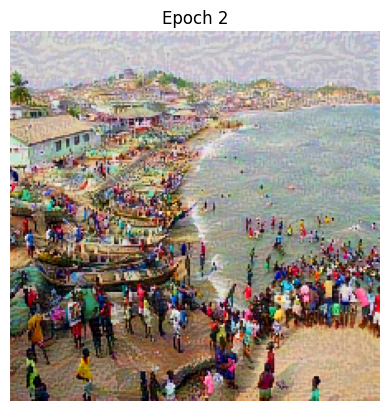

Epoch 4: Loss = 3248385792.0


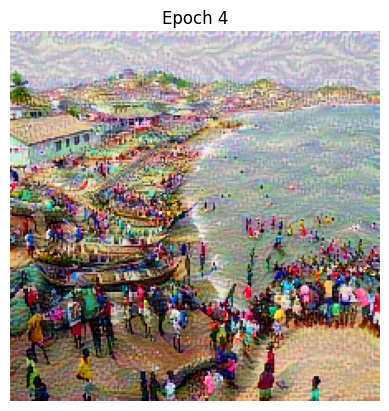

Epoch 6: Loss = 2591490304.0


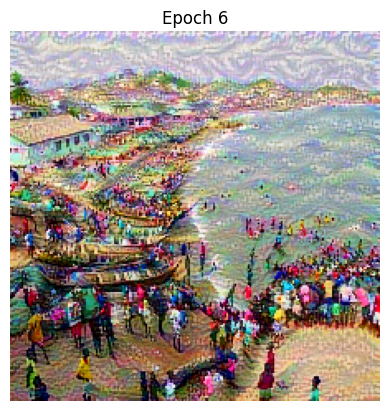

Epoch 8: Loss = 2001732096.0


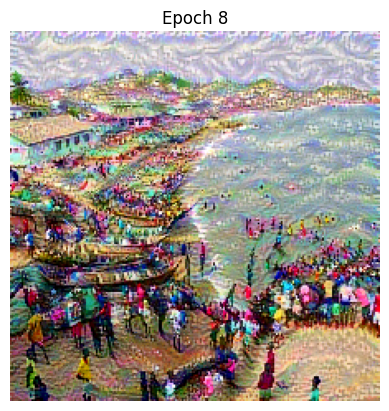

Epoch 10: Loss = 1445978496.0


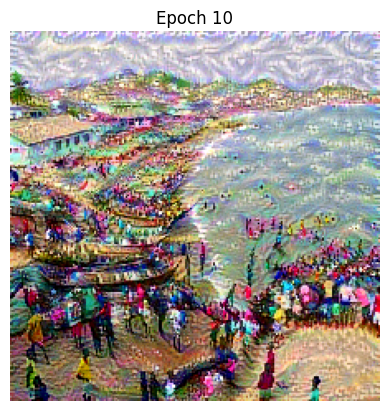

Epoch 12: Loss = 1104944896.0


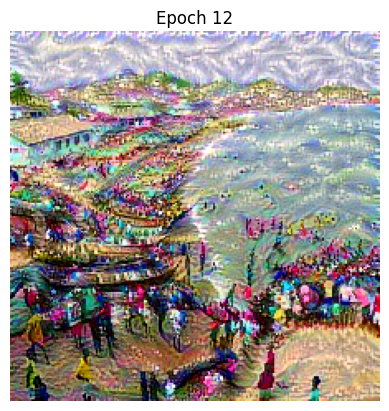

Epoch 14: Loss = 896057088.0


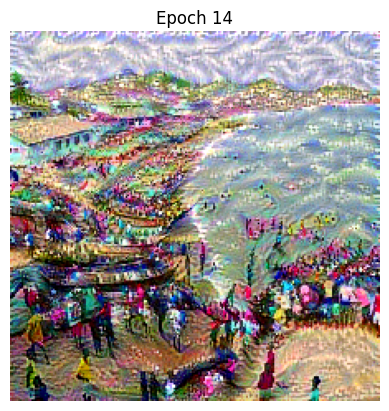

Epoch 16: Loss = 742922624.0


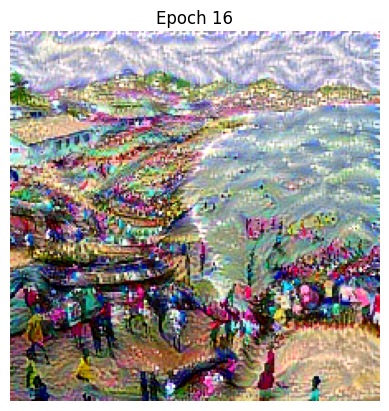

Epoch 18: Loss = 640757888.0


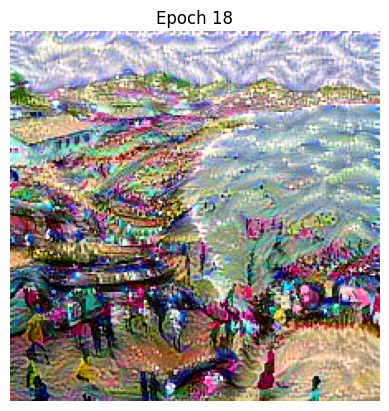

Epoch 20: Loss = 555798016.0


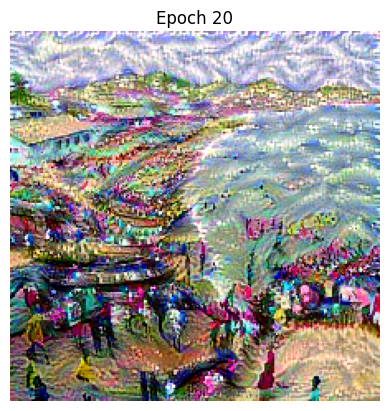

Epoch 22: Loss = 496346400.0


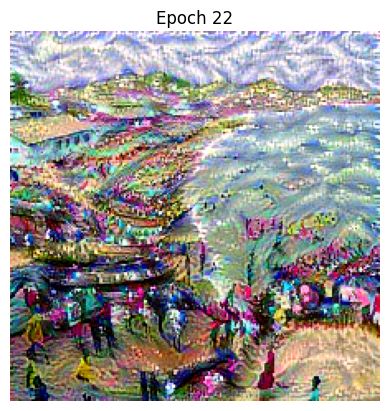

Epoch 24: Loss = 447110784.0


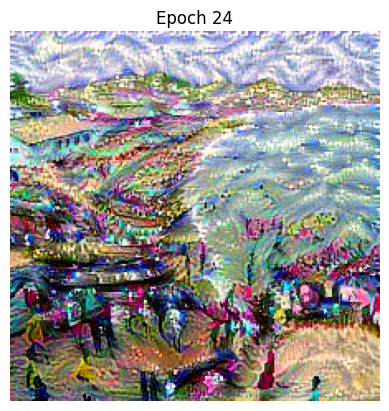

Epoch 26: Loss = 400826624.0


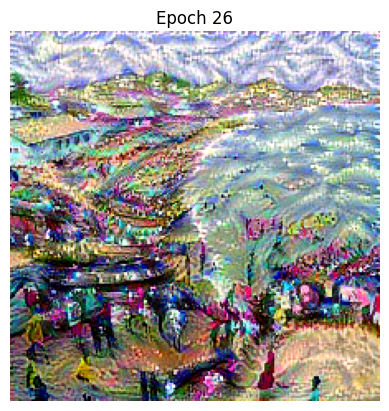

Epoch 28: Loss = 364239936.0


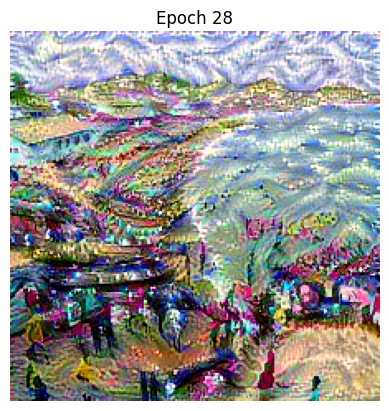

Epoch 30: Loss = 334957312.0


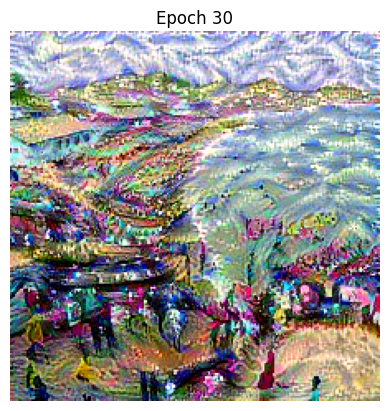

Epoch 32: Loss = 305922688.0


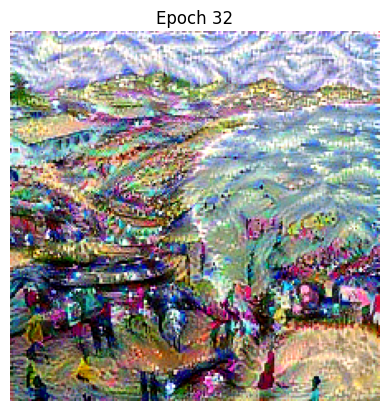

Epoch 34: Loss = 282019872.0


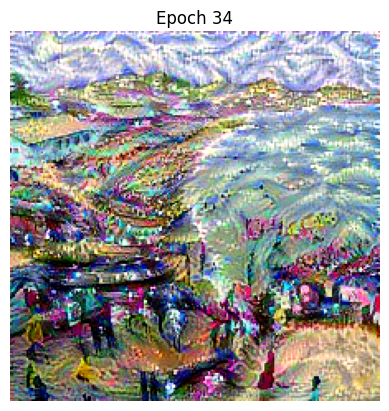

Epoch 36: Loss = 261442688.0


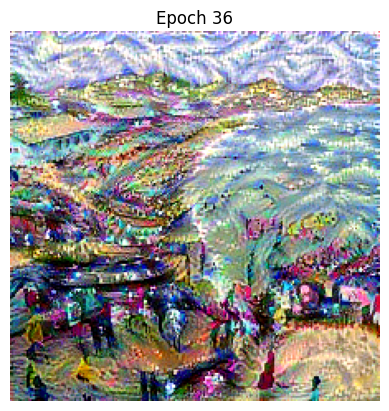

Epoch 38: Loss = 241891360.0


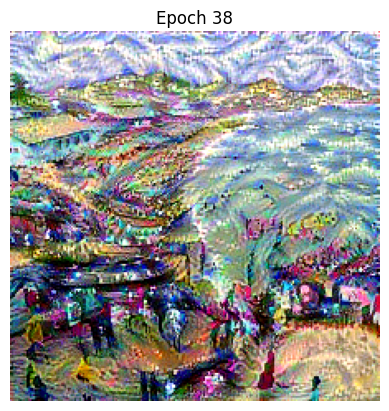

Epoch 40: Loss = 224873200.0


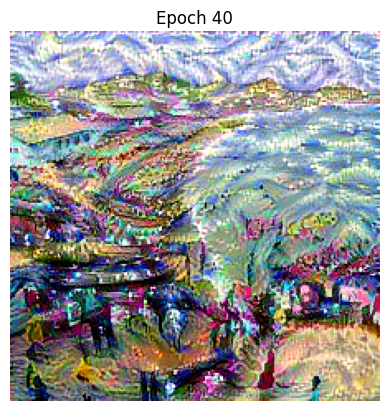

Epoch 42: Loss = 210235744.0


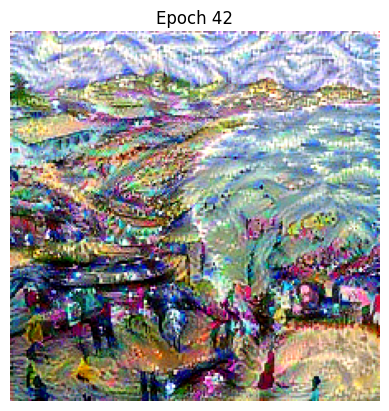

Epoch 44: Loss = 197497392.0


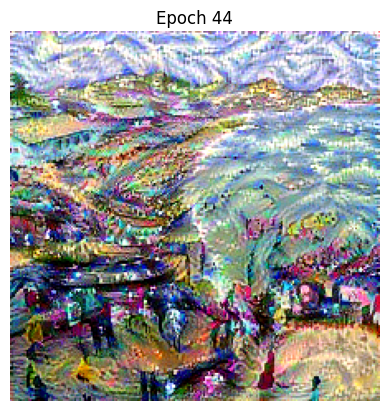

Epoch 46: Loss = 186150352.0


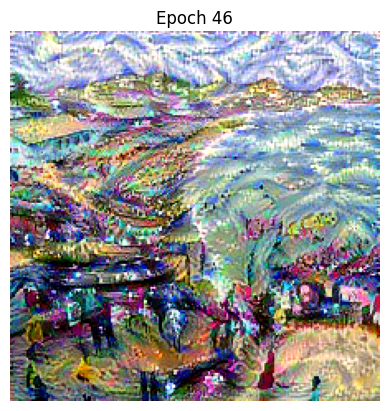

Epoch 48: Loss = 175990576.0


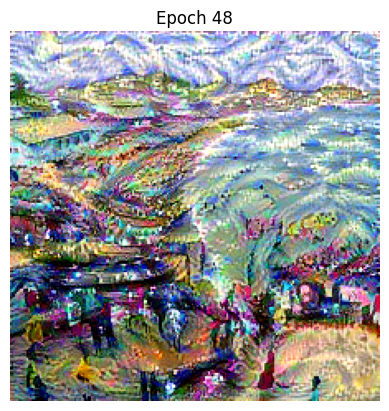

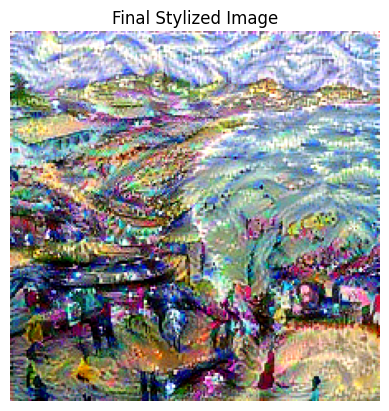

In [22]:
# Initialize the generated image and train
generated_image = tf.Variable(content_image, dtype=tf.float32)
epochs = 50
display_step = 2

for i in range(epochs):
    loss = train_step(generated_image)
    if i % display_step == 0:
        print(f"Epoch {i}: Loss = {loss.numpy()}")
        img = deprocess_image(generated_image.numpy())
        plt.imshow(img)
        plt.title(f"Epoch {i}")
        plt.axis('off')
        plt.show()

# Display and save the final output
final_image = deprocess_image(generated_image.numpy())
plt.imshow(final_image)
plt.title("Final Stylized Image")
plt.axis('off')
plt.show()